In [7]:
# Install required packages
!pip install plotly scikit-learn numpy pandas

In [8]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.datasets import make_moons, make_classification
from sklearn.model_selection import train_test_split

In [9]:
# ================================================
# 1. Basic Decision Tree Visualization (3D)
# ================================================

# Generate 3D synthetic data
X, y = make_classification(n_samples=500, n_features=3, n_redundant=0,
                          n_classes=3, n_clusters_per_class=1,
                          random_state=42)
df = pd.DataFrame(X, columns=['Feature1', 'Feature2', 'Feature3'])
df['Class'] = y

# Interactive 3D scatter plot
fig = px.scatter_3d(df, x='Feature1', y='Feature2', z='Feature3',
                    color='Class', opacity=0.7,
                    title="3D Feature Space Visualization")
fig.update_layout(margin=dict(l=0, r=0, b=0, t=30))
fig.show()

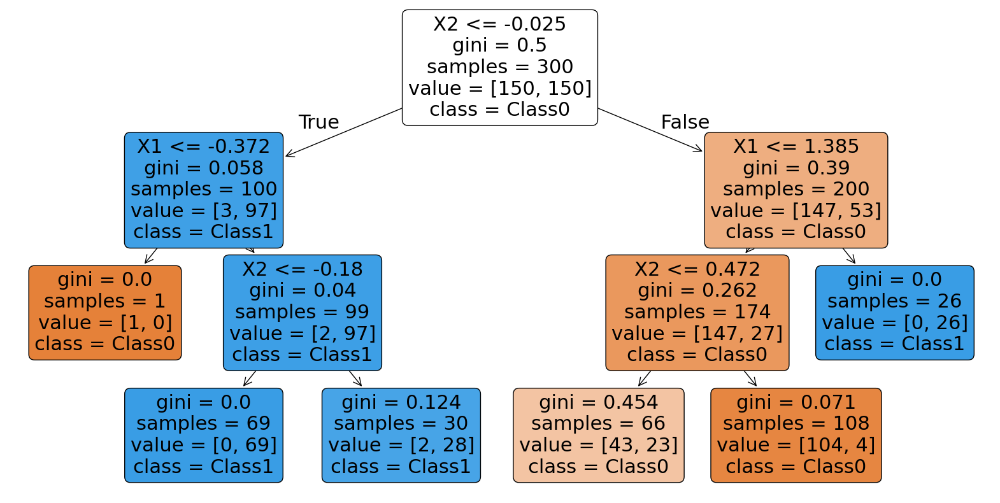

|--- X2 <= -0.03
|   |--- X1 <= -0.37
|   |   |--- class: 0
|   |--- X1 >  -0.37
|   |   |--- X2 <= -0.18
|   |   |   |--- class: 1
|   |   |--- X2 >  -0.18
|   |   |   |--- class: 1
|--- X2 >  -0.03
|   |--- X1 <= 1.38
|   |   |--- X2 <= 0.47
|   |   |   |--- class: 0
|   |   |--- X2 >  0.47
|   |   |   |--- class: 0
|   |--- X1 >  1.38
|   |   |--- class: 1



In [11]:
# ================================================
# 2. Decision Tree Structure Visualization
# ================================================

# Simple 2D non-linear data
X_moons, y_moons = make_moons(n_samples=300, noise=0.2, random_state=42)

# Train decision tree
tree = DecisionTreeClassifier(max_depth=3)
tree.fit(X_moons, y_moons)

# Plot interactive tree structure
plt.figure(figsize=(20,10))
plot_tree(tree, filled=True, feature_names=['X1', 'X2'],
          class_names=['Class0', 'Class1'], rounded=True)
plt.show()

# Text-based tree rules
print(export_text(tree, feature_names=['X1', 'X2']))


In [12]:
# ================================================
# 3. Interactive Decision Boundary (3D Surface)
# ================================================

# Create mesh grid
x_min, x_max = X_moons[:, 0].min() - 1, X_moons[:, 0].max() + 1
y_min, y_max = X_moons[:, 1].min() - 1, X_moons[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                    np.arange(y_min, y_max, 0.01))
Z = tree.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Create 3D surface plot
fig = go.Figure()
fig.add_trace(go.Surface(x=xx, y=yy, z=Z, colorscale='Viridis',
                        opacity=0.5, name='Decision Boundary'))
fig.add_trace(go.Scatter3d(x=X_moons[:,0], y=X_moons[:,1], z=y_moons,
                          mode='markers', marker=dict(
                              size=5, color=y_moons,
                              colorscale='RdBu'),
                          name='Data Points'))
fig.update_layout(title='3D Decision Boundary Visualization',
                 scene=dict(xaxis_title='Feature 1',
                           yaxis_title='Feature 2',
                           zaxis_title='Class Probability'))
fig.show()

In [13]:
# ================================================
# 4. Feature Space Partitioning (Interactive)
# ================================================

# Generate feature importance data
feature_importance = tree.feature_importances_
importance_df = pd.DataFrame({
    'Feature': ['X1', 'X2'],
    'Importance': feature_importance
})

# Interactive bar chart
fig = px.bar(importance_df, x='Feature', y='Importance',
             title='Feature Importance', color='Feature',
             text_auto='.2f')
fig.update_layout(showlegend=False)
fig.show()

In [14]:
# ================================================
# 5. Advanced: Decision Path Visualization
# ================================================

# Create interactive decision path animation
decision_path = tree.decision_path(X_moons).todense()

fig = go.Figure()
for i in range(len(X_moons)):
    fig.add_trace(
        go.Scatter3d(
            x=[X_moons[i,0]],
            y=[X_moons[i,1]],
            z=[decision_path[i].sum()],  # Depth of decision path
            mode='markers',
            marker=dict(
                size=8,
                color=decision_path[i].sum(),
                colorscale='Rainbow',
                opacity=0.7
            ),
            name=f"Sample {i}"
        )
    )

fig.update_layout(
    title='Decision Path Depth Visualization',
    scene=dict(
        xaxis_title='Feature 1',
        yaxis_title='Feature 2',
        zaxis_title='Decision Path Depth'
    )
)
fig.show()